This notebook generates UMAP plots for the organoid dataset

# plotting UMAPs

## Imports

In [1]:
list_of_packages <- c("ggplot2", "dplyr", "tidyr", "circlize")
for (package in list_of_packages) {
    suppressPackageStartupMessages(
        suppressWarnings(
            library(
                package,
                character.only = TRUE,
                quietly = TRUE,
                warn.conflicts = FALSE
            )
        )
    )
}
#

In [2]:
# Get the current working directory and find Git root
find_git_root <- function() {
    # Get current working directory
    cwd <- getwd()
    
    # Check if current directory has .git
    if (dir.exists(file.path(cwd, ".git"))) {
        return(cwd)
    }
    
    # If not, search parent directories
    current_path <- cwd
    while (dirname(current_path) != current_path) {  # While not at root
        parent_path <- dirname(current_path)
        if (dir.exists(file.path(parent_path, ".git"))) {
            return(parent_path)
        }
        current_path <- parent_path
    }
    
    # If no Git root found, stop with error
    stop("No Git root directory found.")
}

# Find the Git root directory
root_dir <- find_git_root()
cat("Git root directory:", root_dir, "\n")

Git root directory: /Users/kaylorhuang/Documents/GitHub_Repos/Kaylor---NF1_organoid_profile_analysis 


In [3]:
figures_path <- file.path(root_dir,"1.EDA/figures/umaps")
if (!dir.exists(figures_path)) {
  dir.create(figures_path, recursive = TRUE)
}

In [4]:
umap_theme <- theme(
        plot.title = element_text(hjust = 0.5, size = 16),
        axis.title.x = element_text(size = 14),
        axis.title.y = element_text(size = 14),
        legend.title = element_text(size = 14, hjust = 0.5),
        legend.text = element_text(size = 12)
    )

## Plotting UMAPs for organoid dataset

In [5]:
#SETTING UP INPUTS FOR GRAPHS

#organoid_umap_results <- arrow::read_parquet(file.path(root_dir,"1.EDA/results/umap/organoid_fs_umap.parquet"))
#head(organoid_umap_results)

max_projection_2D_sc_umap_results <- arrow::read_parquet(file.path(root_dir,"1.EDA/results/umap/2D/max_projection/sc_fs_umap.parquet"))
head(max_projection_2D_sc_umap_results)
#Combining STAURO and Staurosporine into one label
max_projection_2D_sc_umap_results <- max_projection_2D_sc_umap_results %>%
    mutate(Metadata_treatment = ifelse(Metadata_treatment == "STAURO", "Staurosporine", Metadata_treatment))

sc_3D_umap_results <- arrow::read_parquet(file.path(root_dir,"1.EDA/results/umap/3D/sc_fs_umap.parquet"))
head(sc_3D_umap_results)
sc_3D_umap_results <- sc_3D_umap_results %>%
    mutate(Metadata_treatment = ifelse(Metadata_treatment == "STAURO", "Staurosporine", Metadata_treatment))


middle_slice_2D_sc_umap_results <- arrow::read_parquet(file.path(root_dir,"1.EDA/results/umap/2D/middle_slice/sc_fs_umap.parquet"))
head(middle_slice_2D_sc_umap_results)
middle_slice_2D_sc_umap_results <- middle_slice_2D_sc_umap_results %>%
    mutate(Metadata_treatment = ifelse(Metadata_treatment == "STAURO", "Staurosporine", Metadata_treatment))

Metadata_WellRow,Metadata_WellCol,Metadata_Well,Metadata_treatment,Metadata_dose,Metadata_unit,Metadata_Treatment,Metadata_Target,Metadata_Class,Metadata_Therapeutic_Categories,⋯,Metadata_Plate,Metadata_Cells_Number_Object_Number,Metadata_Cytoplasm_Parent_Cells,Metadata_Cytoplasm_Parent_Nuclei,Metadata_Nuclei_Number_Object_Number,Metadata_patient_tumor,Metadata_patient,Metadata_tumor,UMAP1,UMAP2
<chr>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<int>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>
C,2,C2,Staurosporine,10,nM,Staurosporine,Apoptosis induction,Small Molecule,Experimental,⋯,NF0014,1,1,1,1,NF0014_T1,NF0014,T1,13.36766,8.345984
C,2,C2,Staurosporine,10,nM,Staurosporine,Apoptosis induction,Small Molecule,Experimental,⋯,NF0014,2,2,2,2,NF0014_T1,NF0014,T1,13.43125,8.361634
C,2,C2,Staurosporine,10,nM,Staurosporine,Apoptosis induction,Small Molecule,Experimental,⋯,NF0014,3,3,3,3,NF0014_T1,NF0014,T1,13.35517,8.328794
C,2,C2,Staurosporine,10,nM,Staurosporine,Apoptosis induction,Small Molecule,Experimental,⋯,NF0014,4,4,4,4,NF0014_T1,NF0014,T1,13.37926,8.368149
C,2,C2,Staurosporine,10,nM,Staurosporine,Apoptosis induction,Small Molecule,Experimental,⋯,NF0014,5,5,5,5,NF0014_T1,NF0014,T1,13.35502,8.357718
C,2,C2,Staurosporine,10,nM,Staurosporine,Apoptosis induction,Small Molecule,Experimental,⋯,NF0014,6,6,6,6,NF0014_T1,NF0014,T1,13.27870,8.337650


Metadata_patient_tumor,Metadata_patient_id,Metadata_patient,Metadata_tumor,Metadata_object_id,Metadata_unit,Metadata_dose,Metadata_treatment,Metadata_Target,Metadata_Class,⋯,Metadata_Well,Metadata_parent_organoid,Metadata_cqc.organoid_flagged,Metadata_cqc.nan_detected,Metadata_cqc.missing_parent_organoid,Metadata_cqc.small_nuclei_outlier,Metadata_cqc.large_nuclei_outlier,Metadata_cqc.mass_displacement_outlier,UMAP1,UMAP2
<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<dbl>,<chr>,<chr>,<chr>,⋯,<chr>,<int>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>
NF0014_T1,NF0014_T1,NF0014,T1,61,uM,1,Fimepinostat,PI3K and HDAC inhibitor,Small Molecule,⋯,E5,-1,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,15.96665,2.6224227
NF0014_T1,NF0014_T1,NF0014,T1,114,uM,1,Fimepinostat,PI3K and HDAC inhibitor,Small Molecule,⋯,E5,-1,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,15.25360,4.8424664
NF0014_T1,NF0014_T1,NF0014,T1,184,uM,1,Fimepinostat,PI3K and HDAC inhibitor,Small Molecule,⋯,E5,-1,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,2.41517,8.9231701
NF0014_T1,NF0014_T1,NF0014,T1,219,uM,1,Fimepinostat,PI3K and HDAC inhibitor,Small Molecule,⋯,E5,-1,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,15.92349,3.3527954
NF0014_T1,NF0014_T1,NF0014,T1,255,uM,1,Fimepinostat,PI3K and HDAC inhibitor,Small Molecule,⋯,E5,-1,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,10.49919,0.9640226
NF0014_T1,NF0014_T1,NF0014,T1,54,uM,1,Fimepinostat,PI3K and HDAC inhibitor,Small Molecule,⋯,D5,-1,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,10.49397,0.9657854


Metadata_WellRow,Metadata_WellCol,Metadata_Well,Metadata_treatment,Metadata_dose,Metadata_unit,Metadata_Treatment,Metadata_Target,Metadata_Class,Metadata_Therapeutic_Categories,⋯,Metadata_Plate,Metadata_Cells_Number_Object_Number,Metadata_Cytoplasm_Parent_Cells,Metadata_Cytoplasm_Parent_Nuclei,Metadata_Nuclei_Number_Object_Number,Metadata_patient_tumor,Metadata_patient,Metadata_tumor,UMAP1,UMAP2
<chr>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<int>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>
C,2,C2,Staurosporine,10,nM,Staurosporine,Apoptosis induction,Small Molecule,Experimental,⋯,NF0014,1,1,2,2,NF0014_T1,NF0014,T1,12.289029,-15.78946
C,2,C2,Staurosporine,10,nM,Staurosporine,Apoptosis induction,Small Molecule,Experimental,⋯,NF0014,2,2,3,3,NF0014_T1,NF0014,T1,12.334114,-15.75360
C,2,C2,Staurosporine,10,nM,Staurosporine,Apoptosis induction,Small Molecule,Experimental,⋯,NF0014,3,3,4,4,NF0014_T1,NF0014,T1,12.490737,-15.66635
D,2,D2,Digoxin,1,uM,Digoxin,Na+/K+ pump inhibitor,Small Molecule,Cardiac Glycosides,⋯,NF0014,1,1,2,2,NF0014_T1,NF0014,T1,12.406902,-11.56255
D,2,D2,Digoxin,1,uM,Digoxin,Na+/K+ pump inhibitor,Small Molecule,Cardiac Glycosides,⋯,NF0014,2,2,3,3,NF0014_T1,NF0014,T1,9.962565,-13.41369
D,2,D2,Digoxin,1,uM,Digoxin,Na+/K+ pump inhibitor,Small Molecule,Cardiac Glycosides,⋯,NF0014,3,3,4,4,NF0014_T1,NF0014,T1,9.873981,-12.05968


### Color mapping for MOAs

In [6]:
# set custom colors for each MOA
custom_MOA_palette <- c(
    'Control' = "#5a5c5d",
    'MEK1/2 inhibitor' = "#882E8B",
    

    'HDAC inhibitor' = "#1E6B61",
    'PI3K and HDAC inhibitor' = "#2E6B8B",
    'PI3K inhibitor'="#0092E0",

    'receptor tyrosine kinase inhibitor' = "#576A20",
    'tyrosine kinase inhibitor' = "#646722",

    'mTOR inhibitor' = "#ACE089",  
    'IGF-1R inhibitor' = "#ACE040",

    'HSP90 inhibitor'="#33206A",
    'Apoptosis induction'="#272267",
    'Na+/K+ pump inhibitor' = "#A16C28",
    'histamine H1 receptor antagonist' = "#3A8F00",
    'DNA binding' = "#174F17",
    'BRD4 inhibitor' = "#ff0000"
    
)
    

### Color mapping for Treatments

In [7]:
# Set custom colors for each treatment
custom_treatment_palette <- c(
    'DMSO' = "#5a5c5d",              # Control - gray
    'Staurosporine' = "#7D2780",     # Dark purple
    
    'Fimepinostat' = "#1E6B61",      # Teal (HDAC inhibitor)
    'Copanlisib' = "#0092E0",        # Blue (PI3K inhibitor)
    
    'Imatinib' = "#576A20",          # Olive green
    'Nilotinib' = "#646722",         # Yellow-green
    'Cabozantinib' = "#758B2D",      # Light olive
    
    'Everolimus' = "#ACE089",        # Light green (mTOR inhibitor)
    'Rapamycin' = "#90D070",         # Medium green (mTOR inhibitor)
    'Linsitinib' = "#ACE040",        # Yellow-green (IGF-1R inhibitor)
    
    'Onalespib' = "#33206A",         # Dark purple (HSP90 inhibitor)
    'Digoxin' = "#A16C28",           # Orange-brown
    'Ketotifen' = "#3A8F00",         # Green
    
    'Binimetinib' = "#ff0000",       # Red (MEK inhibitor)
    'Mirdametinib' = "#cc0000",      # Dark red (MEK inhibitor)
    'Trametinib' = "#ff3333",        # Light red (MEK inhibitor)
    'Selumetinib' = "#ff6666"        # Lighter red (MEK inhibitor)
)

### Organoid features

In [8]:
# head(organoid_umap_results)

In [9]:
# width <- 10
# height <- 5
# options(repr.plot.width = width, repr.plot.height = height)
# umap_organoid_plot <- (
#     ggplot(organoid_umap_results, aes(x = UMAP1, y = UMAP2, color = Target, size = single_cell_count))
#     + geom_point(alpha = 0.5)
#     + scale_color_manual(values = custom_MOA_palette)
#     + labs(title = "All patients: Organoid FS Profiles", x = "UMAP 0", y = "UMAP 1")
#     + theme_bw()
#     + umap_theme
    
#     + guides(
#         size = guide_legend(
#             title = "Single Cell Count",
#             text = element_text(size = 16, hjust = 0.5, position = "top"),
#             nrow = 1,            
#             ),
#         color = guide_legend(
#             title = "Target",
#             text = element_text(size = 16, hjust = 0.5),
#             override.aes = list(alpha = 1,size = 5),
#             ncol = 1
#         )
#     )
#     + facet_wrap(~patient, nrow = 2)
# )
# organoid_features_path <- file.path(figures_path, "all_patients_umap_organoid_features_facet_by_patient.png")
# ggsave(umap_organoid_plot, file = organoid_features_path, width = width, height = height, dpi = 300)
# umap_organoid_plot

In [10]:
# patients <- unique(organoid_umap_results$patient)
# hex_codes <- c(
# "#86C436",
# "#BFD468",
# "#36C4BB",
# "#68D4B4",
# "#7336C4",
# "#7E68D4",
# "#C4363F",
# "#D46888"
# )
# patient_color_palette <- setNames(hex_codes[1:length(patients)], patients)

In [11]:
# width <- 10
# height <- 5
# options(repr.plot.width = width, repr.plot.height = height)
# umap_organoid_plot <- (
#     ggplot(organoid_umap_results, aes(x = UMAP1, y = UMAP2, color = patient, size = single_cell_count))
#     + geom_point(alpha = 0.7)
#     + scale_color_manual(values = patient_color_palette)
#     + labs(title = "All patients: Organoid FS Profiles", x = "UMAP 0", y = "UMAP 1")
#     + theme_bw()
#     + umap_theme
#     + guides(
#         size = guide_legend(
#             title = "Single Cell Count",
#             text = element_text(size = 16, hjust = 0.5, position = "top"),
#             nrow = 1,
#             ),
#         color = guide_legend(
#             title = "Patient",
#             text = element_text(size = 16, hjust = 0.5),
#             override.aes = list(alpha = 1,size = 5),
#             ncol = 1
#         )
#     )
#     + facet_wrap(~Target, nrow = 4)
# )
# organoid_features_path <- file.path(figures_path, "all_patients_umap_organoid_features_facet_by_target.png")

# ggsave(umap_organoid_plot, file = organoid_features_path, width = width, height = height, dpi = 300)
# umap_organoid_plot

In [12]:
# get just the DMSO treatments
# organoid_umap_results_dmsos <- organoid_umap_results %>% filter(Target == "Control")

In [13]:
# width <- 10
# height <- 5
# options(repr.plot.width = width, repr.plot.height = height)
# umap_organoid_plot <- (
#     ggplot(organoid_umap_results_dmsos, aes(x = UMAP1, y = UMAP2, color = patient, size = single_cell_count))
#     + geom_point(alpha = 0.7)
#     + scale_color_manual(values = patient_color_palette)
#     + labs(title = "All patients: Organoid FS Profiles", x = "UMAP 0", y = "UMAP 1")
#     + theme_bw()
#     + umap_theme

#     + guides(
#         size = guide_legend(
#             title = "Single Cell Count",
#             text = element_text(size = 16, hjust = 0.5, position = "top"),
#             nrow = 1,
#             ),
#         color = guide_legend(
#             title = "Patients",
#             text = element_text(size = 16, hjust = 0.5),
#             override.aes = list(alpha = 1,size = 5),
#             ncol = 1
#         )
#     )
# )
# organoid_features_path <- file.path(figures_path, "all_patients_controls_only_umap_organoid_features.png")

# ggsave(umap_organoid_plot, file = organoid_features_path, width = width, height = height, dpi = 300)
# umap_organoid_plot

## Single cell features

## 2D MIP Analysis


In [14]:
# Define all possible patients upfront
all_patients <- c("NF0014", "NF0016", "NF0018", "NF0021", "NF0030",  "NF0040", "SARCO219", "SARCO361")

hex_codes <- c(
    "#86C436",
    "#BFD468",
    "#36C4BB",
    "#68D4B4",
    "#7336C4",
    "#7E68D4",
    "#C4363F",
    "#D46888"
)

# Create master palette
master_patient_palette <- setNames(hex_codes[1:length(all_patients)], all_patients)

patient_color_palette <- master_patient_palette[names(master_patient_palette) %in% unique(max_projection_2D_sc_umap_results$Metadata_patient)]

2D MIP facet by patient, colored by treatment

Warning message:
“Removed 654 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 654 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 654 rows containing missing values or values outside the scale range
(`geom_point()`).”


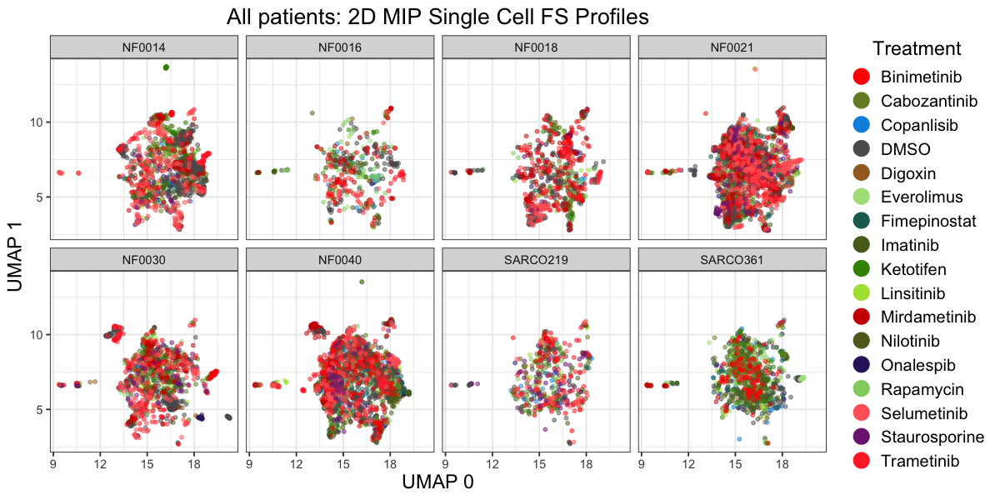

In [15]:
width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot <- (
    ggplot(max_projection_2D_sc_umap_results, aes(x = UMAP1, y = UMAP2, color = Metadata_treatment))
    + geom_point(alpha = 0.5, size = 1)
    + scale_color_manual(values = custom_treatment_palette)
    + labs(title = "All patients: 2D MIP Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            title = "Treatment",
            override.aes = list(alpha = 1,size = 5),
            ncol = 1
        )
    )
    + facet_wrap(~Metadata_patient, nrow = 2)
)
sc_2D_MIP_facet_by_features_path <- file.path(figures_path, "2D", "max_projection", "all_patients_umap_2D_max_intensity_sc_features_facet_by_patient.png")
ggsave(umap_sc_plot, file = sc_2D_MIP_facet_by_features_path, width = width, height = height, dpi = 300)
umap_sc_plot

2D MIP colored by patient

Warning message:
“Removed 654 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 654 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 654 rows containing missing values or values outside the scale range
(`geom_point()`).”


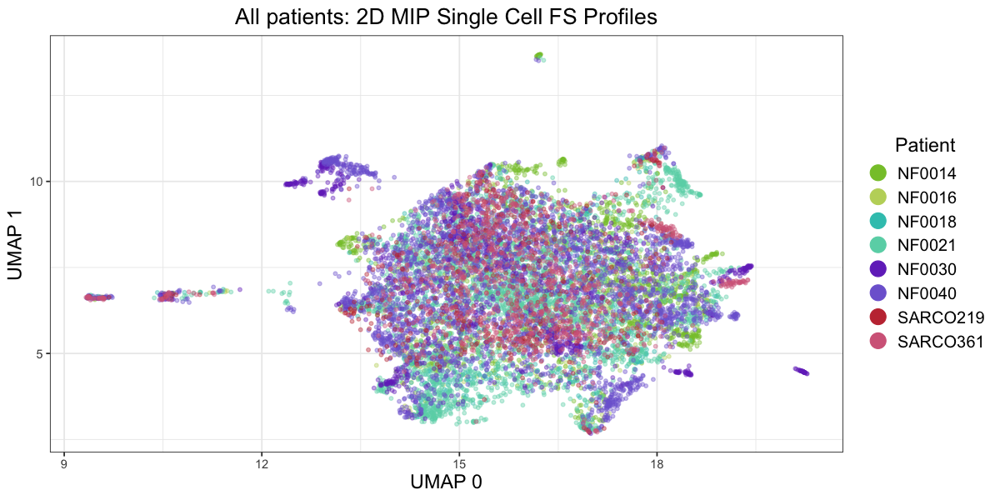

In [16]:
width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot_by_patient <- (
    ggplot(max_projection_2D_sc_umap_results, aes(x = UMAP1, y = UMAP2, color = Metadata_patient))
    + geom_point(alpha = 0.4, size = 1)
    + scale_color_manual(values = patient_color_palette)  # You'll need to define this palette
    + labs(title = "All patients: 2D MIP Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            title = "Patient",
            override.aes = list(alpha = 1, size = 5),
            ncol = 1
        )
    )
)
sc_features_2D_MIP_by_patient_path <- file.path(figures_path, "2D", "max_projection", "all_patients_umap_2D_max_intensity_sc_features_by_patient.png")
ggsave(umap_sc_plot_by_patient, file = sc_features_2D_MIP_by_patient_path, width = width, height = height, dpi = 300)
umap_sc_plot_by_patient

2D MIP Colored by Treatment

Warning message:
“Removed 654 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 654 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 654 rows containing missing values or values outside the scale range
(`geom_point()`).”


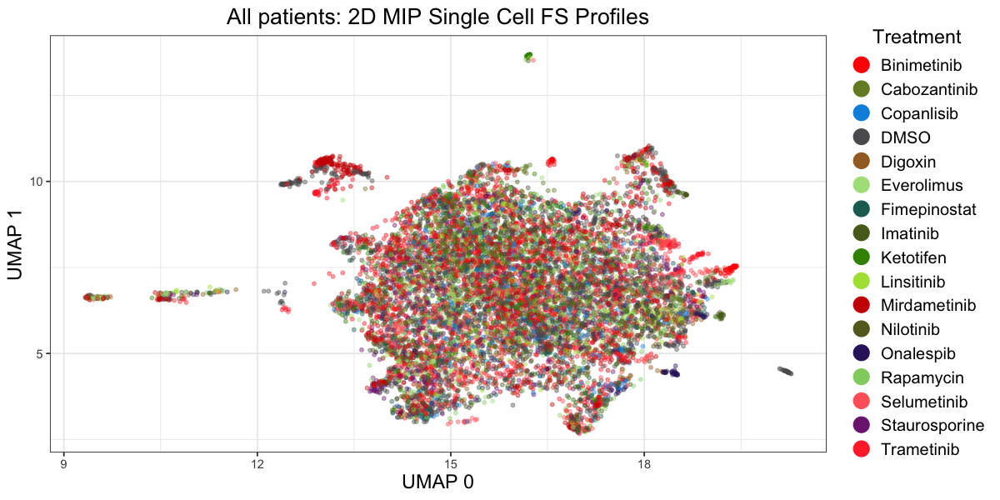

In [17]:
width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot <- (
    ggplot(max_projection_2D_sc_umap_results, aes(x = UMAP1, y = UMAP2, color = Metadata_treatment))
    + geom_point(alpha = 0.4, size = 1)
    + scale_color_manual(values = custom_treatment_palette)
    + labs(title = "All patients: 2D MIP Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            title = "Treatment",
            override.aes = list(alpha = 1, size = 5),
            ncol = 1
        )
    )
)
sc_features_2D_MIP_by_treatment_path <- file.path(figures_path,"2D", "max_projection", "all_patients_umap_2D_max_intensity_sc_features_by_treatment.png")
ggsave(umap_sc_plot, file = sc_features_2D_MIP_by_treatment_path, width = width, height = height, dpi = 300)
umap_sc_plot

2D MIP facet by treatment

Warning message:
“Removed 654 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 654 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 654 rows containing missing values or values outside the scale range
(`geom_point()`).”


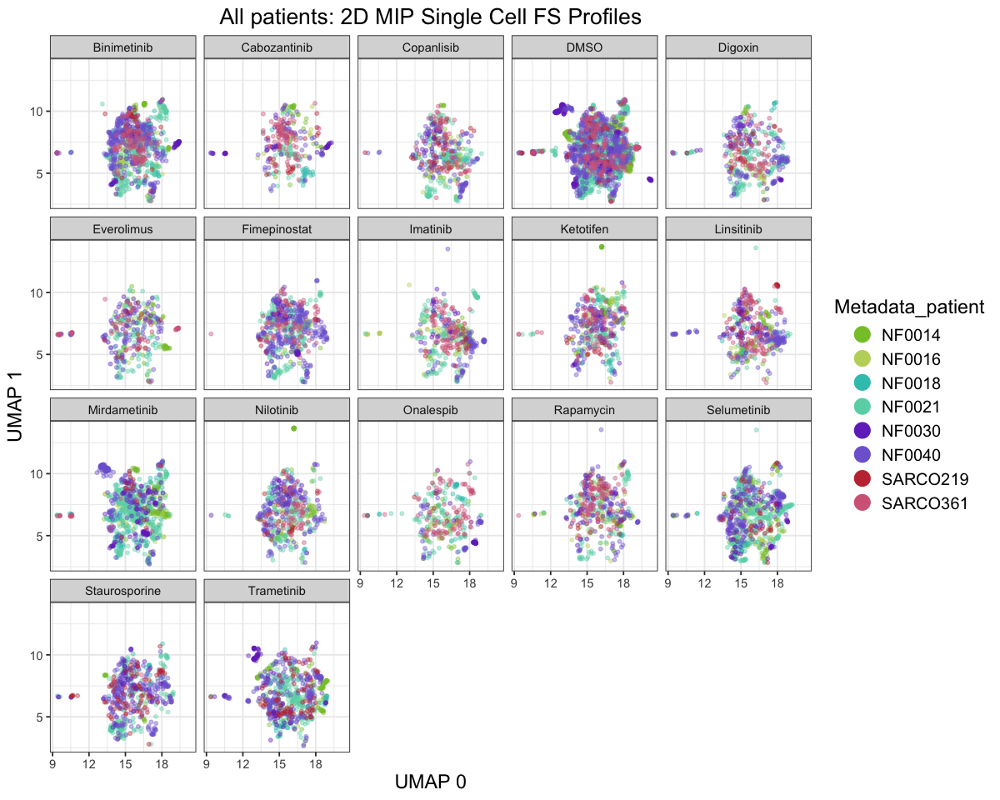

In [18]:
width <- 10
height <- 8
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot_facet_treatment <- (
    ggplot(max_projection_2D_sc_umap_results, aes(x = UMAP1, y = UMAP2, color = Metadata_patient))
    + geom_point(alpha = 0.4, size = 1)
    + scale_color_manual(values = patient_color_palette)
    + labs(title = "All patients: 2D MIP Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            override.aes = list(alpha = 1, size = 5),
            ncol = 1
        )
    )
    + facet_wrap(~Metadata_treatment, nrow = 4)  # Changed from Target to Metadata_treatment
)
sc_features_2D_MIP_facet_by_treatment_path <- file.path(figures_path,"2D", "max_projection", "all_patients_umap_2D_max_intensity_sc_features_facet_by_treatment.png")
ggsave(umap_sc_plot_facet_treatment, file = sc_features_2D_MIP_facet_by_treatment_path, width = width, height = height, dpi = 300)
umap_sc_plot_facet_treatment

2D MIP control only

Warning message:
“Removed 221 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 221 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 221 rows containing missing values or values outside the scale range
(`geom_point()`).”


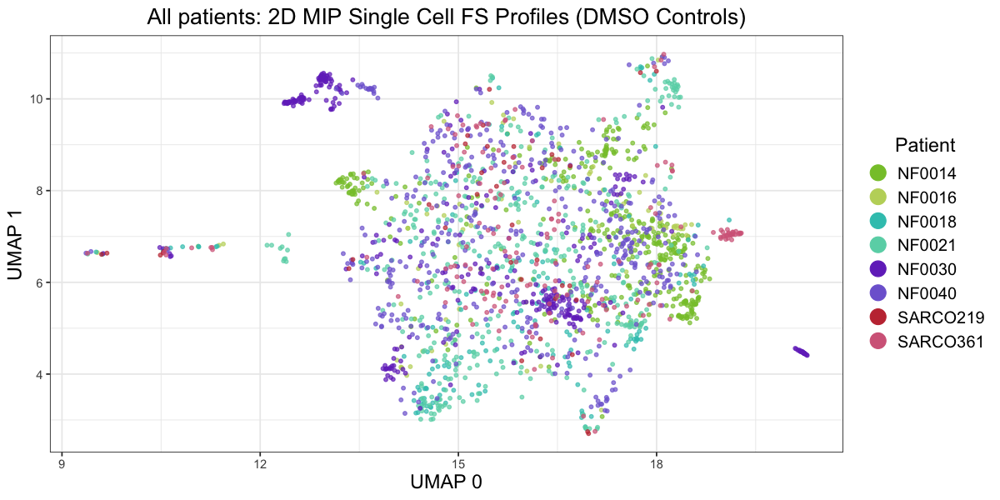

In [19]:
# Filter for DMSO only
sc_umap_results_dmsos <- max_projection_2D_sc_umap_results %>%
    filter(Metadata_treatment == "DMSO")

width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot_dmso <- (
    ggplot(sc_umap_results_dmsos, aes(x = UMAP1, y = UMAP2, color = Metadata_patient))
    + geom_point(alpha = 0.7, size = 1)
    + scale_color_manual(values = patient_color_palette)
    + labs(title = "All patients: 2D MIP Single Cell FS Profiles (DMSO Controls)", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme
    + theme(
        legend.text = element_text(size = 12),
        legend.title = element_text(size = 14, hjust = 0.5)
    )
    + guides(
        color = guide_legend(
            title = "Patient",
            override.aes = list(alpha = 1, size = 5),
            ncol = 1
        )
    )
)
sc_features_2D_MIP_dmso_path <- file.path(figures_path, "2D", "max_projection","all_patient_umap_2D_max_intensity_sc_fs_dmso_only.png")
ggsave(umap_sc_plot_dmso, file = sc_features_2D_MIP_dmso_path, width = width, height = height, dpi = 300)
umap_sc_plot_dmso

## 2D Middle Slice Analysis

2D MS facet by patient, colored by treatment

Warning message:
“Removed 1412 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 1412 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 1412 rows containing missing values or values outside the scale range
(`geom_point()`).”


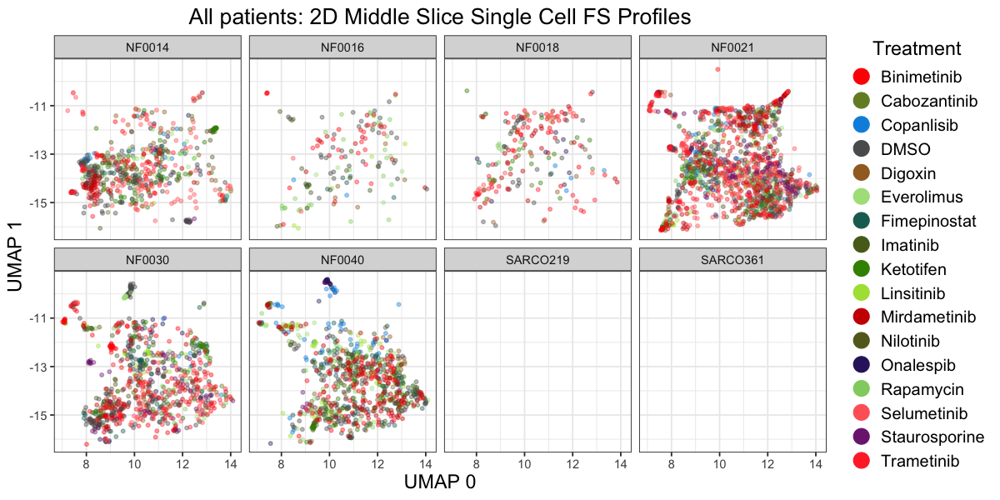

In [20]:
width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot <- (
    ggplot(middle_slice_2D_sc_umap_results, aes(x = UMAP1, y = UMAP2, color = Metadata_treatment))
    + geom_point(alpha = 0.4, size = 1)
    + scale_color_manual(values = custom_treatment_palette)
    + labs(title = "All patients: 2D Middle Slice Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            title = "Treatment",
            override.aes = list(alpha = 1,size = 5),
            ncol = 1
        )
    )
    + facet_wrap(~Metadata_patient, nrow = 2)
)
sc_features_2D_MS_facet_by_patient_path <- file.path(figures_path, "2D", "middle_slice","all_patients_umap_2D_middle_slice_sc_features_facet_by_patient.png")
ggsave(umap_sc_plot, file = sc_features_2D_MS_facet_by_patient_path, width = width, height = height, dpi = 300)
umap_sc_plot

2D MS by patient

Warning message:
“Removed 1412 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 1412 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 1412 rows containing missing values or values outside the scale range
(`geom_point()`).”


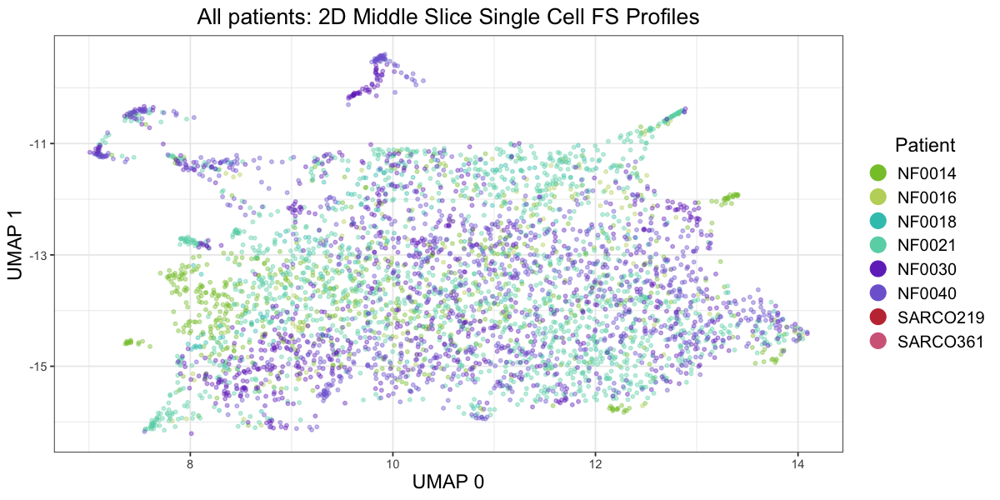

In [21]:
width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot_by_patient <- (
    ggplot(middle_slice_2D_sc_umap_results, aes(x = UMAP1, y = UMAP2, color = Metadata_patient))
    + geom_point(alpha = 0.4, size = 1)
    + scale_color_manual(values = patient_color_palette)  # You'll need to define this palette
    + labs(title = "All patients: 2D Middle Slice Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            title = "Patient",
            override.aes = list(alpha = 1, size = 5),
            ncol = 1
        )
    )
)
sc_features_2D_MS_by_patient_path <- file.path(figures_path, "2D", "middle_slice", "all_patients_umap_2D_middle_slice_sc_features_by_patient.png")
ggsave(umap_sc_plot_by_patient, file = sc_features_2D_MS_by_patient_path, width = width, height = height, dpi = 300)
umap_sc_plot_by_patient

2D MS by treatment

Warning message:
“Removed 1412 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 1412 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 1412 rows containing missing values or values outside the scale range
(`geom_point()`).”


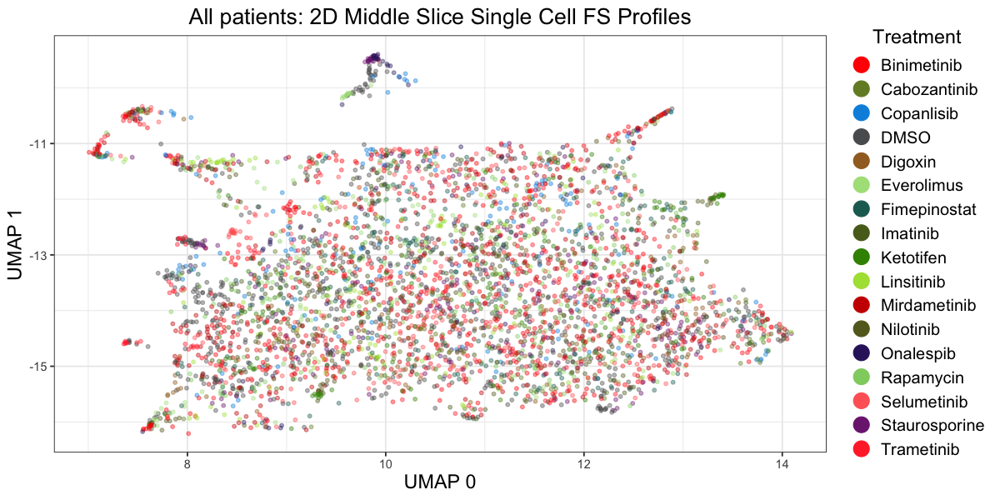

In [22]:
width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot_by_treatment <- (
    ggplot(middle_slice_2D_sc_umap_results, aes(x = UMAP1, y = UMAP2, color = Metadata_treatment))
    + geom_point(alpha = 0.4, size = 1)
    + scale_color_manual(values = custom_treatment_palette)  # You'll need to define this palette
    + labs(title = "All patients: 2D Middle Slice Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            title = "Treatment",
            override.aes = list(alpha = 1, size = 5),
            ncol = 1
        )
    )
)
sc_features_2D_MS_by_treatment_path <- file.path(figures_path, "2D", "middle_slice", "all_patients_umap_2D_middle_slice_sc_features_by_treatment.png")
ggsave(umap_sc_plot_by_treatment, file = sc_features_2D_MS_by_treatment_path, width = width, height = height, dpi = 300)
umap_sc_plot_by_treatment

2D MS faceted by treatmeant

Warning message:
“Removed 1412 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 1412 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 1412 rows containing missing values or values outside the scale range
(`geom_point()`).”


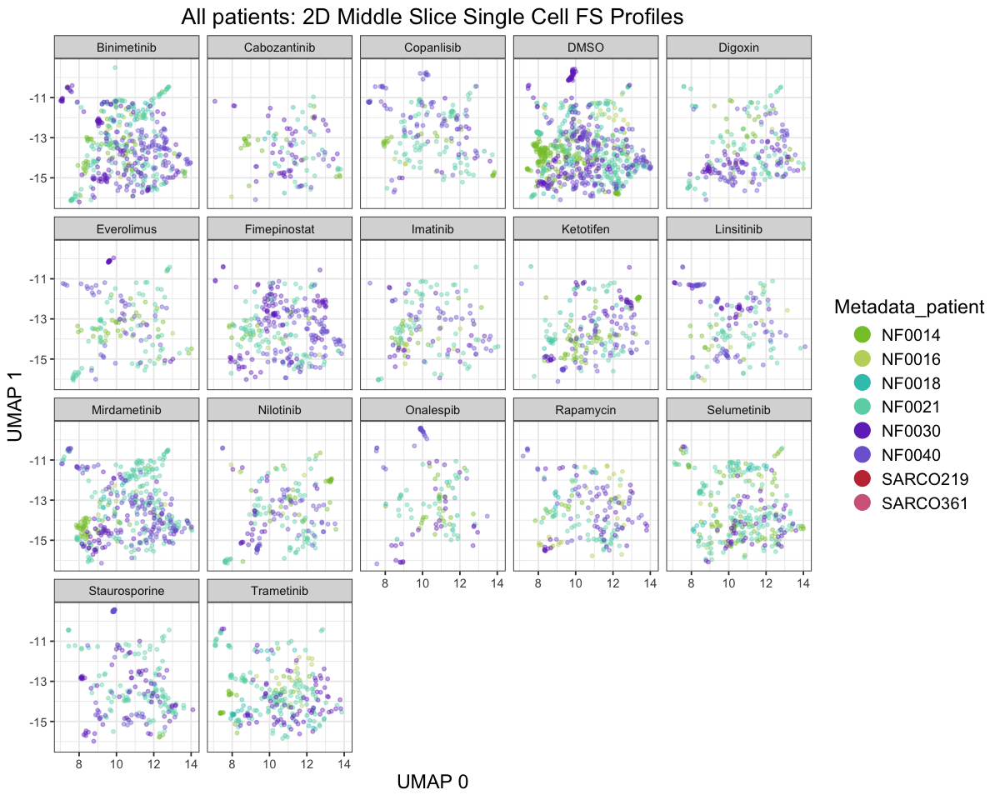

In [23]:
width <- 10
height <- 8
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot_MS_facet_treatment <- (
    ggplot(middle_slice_2D_sc_umap_results, aes(x = UMAP1, y = UMAP2, color = Metadata_patient))
    + geom_point(alpha = 0.4, size = 1)
    + scale_color_manual(values = patient_color_palette)
    + labs(title = "All patients: 2D Middle Slice Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            override.aes = list(alpha = 1, size = 5),
            ncol = 1
        )
    )
    + facet_wrap(~Metadata_treatment, nrow = 4)  
)
sc_features_2D_MS_facet_by_treatment_path <- file.path(figures_path, "2D", "middle_slice", "all_patients_umap_2D_middle_slice_sc_features_facet_by_treatment.png")
ggsave(umap_sc_plot_MS_facet_treatment, file = sc_features_2D_MS_facet_by_treatment_path, width = width, height = height, dpi = 300)
umap_sc_plot_MS_facet_treatment

2D MS controls only

Warning message:
“Removed 379 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 379 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 379 rows containing missing values or values outside the scale range
(`geom_point()`).”


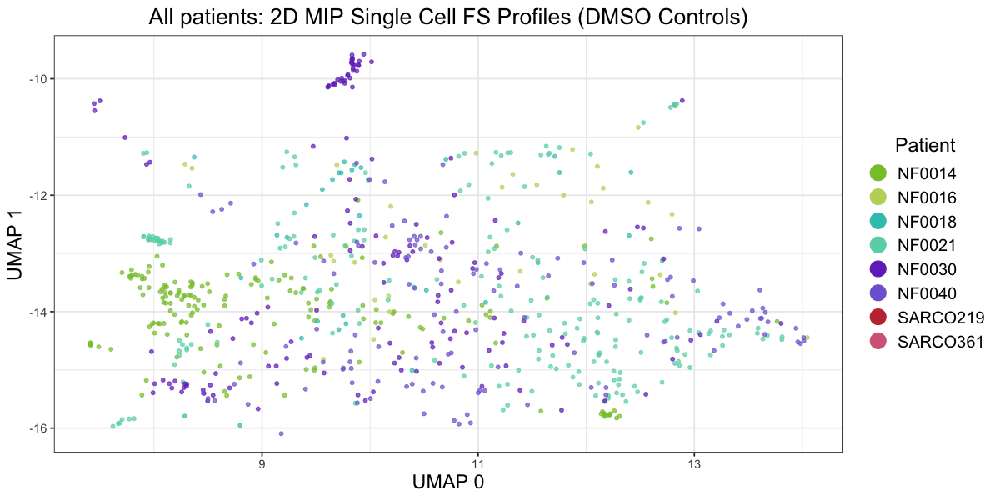

In [24]:
# Filter for DMSO only
sc_umap_results_dmsos <- middle_slice_2D_sc_umap_results %>%
    filter(Metadata_treatment == "DMSO")

width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot_2D_MS_dmso <- (
    ggplot(sc_umap_results_dmsos, aes(x = UMAP1, y = UMAP2, color = Metadata_patient))
    + geom_point(alpha = 0.7, size = 1)
    + scale_color_manual(values = patient_color_palette)
    + labs(title = "All patients: 2D MIP Single Cell FS Profiles (DMSO Controls)", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme
    + theme(
        legend.text = element_text(size = 12),
        legend.title = element_text(size = 14, hjust = 0.5)
    )
    + guides(
        color = guide_legend(
            title = "Patient",
            override.aes = list(alpha = 1, size = 5),
            ncol = 1
        )
    )
)
sc_features_2D_MS_dmso_path <- file.path(figures_path, "2D", "middle_slice", "all_patients_umap_2D_middle_slice_sc_fs_dmso_only.png")
ggsave(umap_sc_plot_2D_MS_dmso, file = sc_features_2D_MS_dmso_path, width = width, height = height, dpi = 300)
umap_sc_plot_2D_MS_dmso

## 3D Analyses

Warning message:
“Removed 10886 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 10886 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 10886 rows containing missing values or values outside the scale range
(`geom_point()`).”


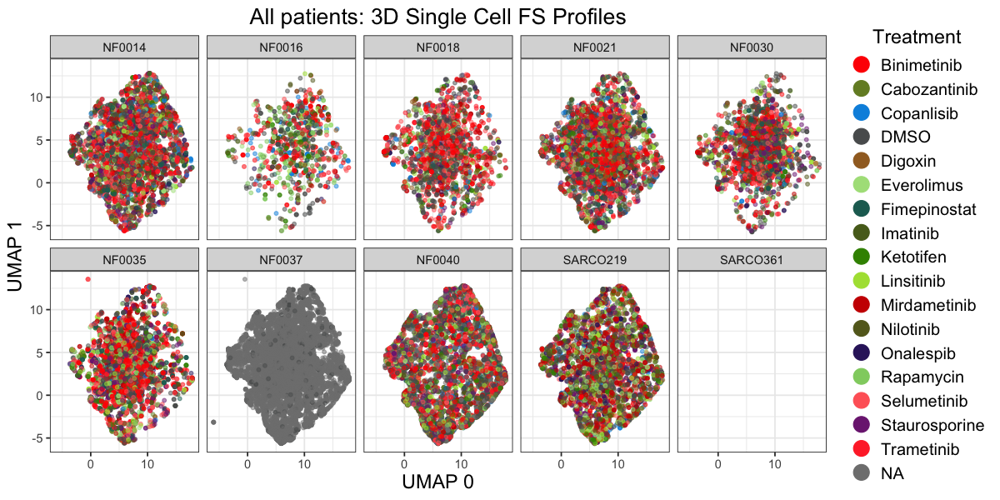

In [25]:
width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot <- (
    ggplot(sc_3D_umap_results, aes(x = UMAP1, y = UMAP2, color = Metadata_treatment))
    + geom_point(alpha = 0.5, size = 1)
    + scale_color_manual(values = custom_treatment_palette)
    + labs(title = "All patients: 3D Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            title = "Treatment",
            override.aes = list(alpha = 1,size = 5),
            ncol = 1
        )
    )
    + facet_wrap(~Metadata_patient, nrow = 2)
)
sc_3D_features_by_treatment_path <- file.path(figures_path, "3D", "all_patients_umap_3D_sc_features_facet_by_patient.png")
ggsave(umap_sc_plot, file = sc_3D_features_by_treatment_path, width = width, height = height, dpi = 300)
umap_sc_plot

Warning message:
“Removed 10886 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 10886 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 10886 rows containing missing values or values outside the scale range
(`geom_point()`).”


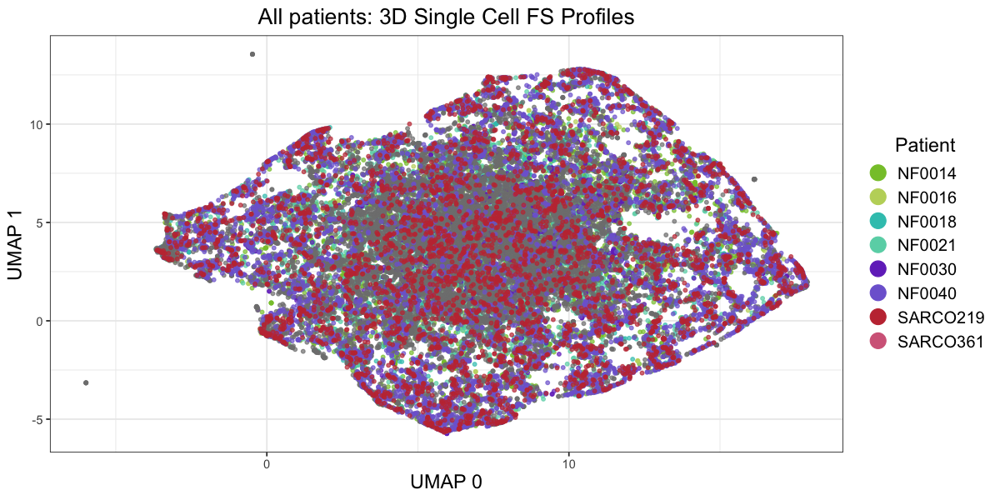

In [26]:
width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot_by_patient <- (
    ggplot(sc_3D_umap_results, aes(x = UMAP1, y = UMAP2, color = Metadata_patient))
    + geom_point(alpha = 0.7, size = 1)
    + scale_color_manual(values = patient_color_palette)  # You'll need to define this palette
    + labs(title = "All patients: 3D Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            title = "Patient",
            override.aes = list(alpha = 1, size = 5),
            ncol = 1
        )
    )
)
sc_features_3D_by_patient_path <- file.path(figures_path, "3D", "all_patients_umap_3D_features_by_patient.png")
ggsave(umap_sc_plot_by_patient, file = sc_features_3D_by_patient_path, width = width, height = height, dpi = 300)
umap_sc_plot_by_patient

Warning message:
“Removed 10886 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 10886 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 10886 rows containing missing values or values outside the scale range
(`geom_point()`).”


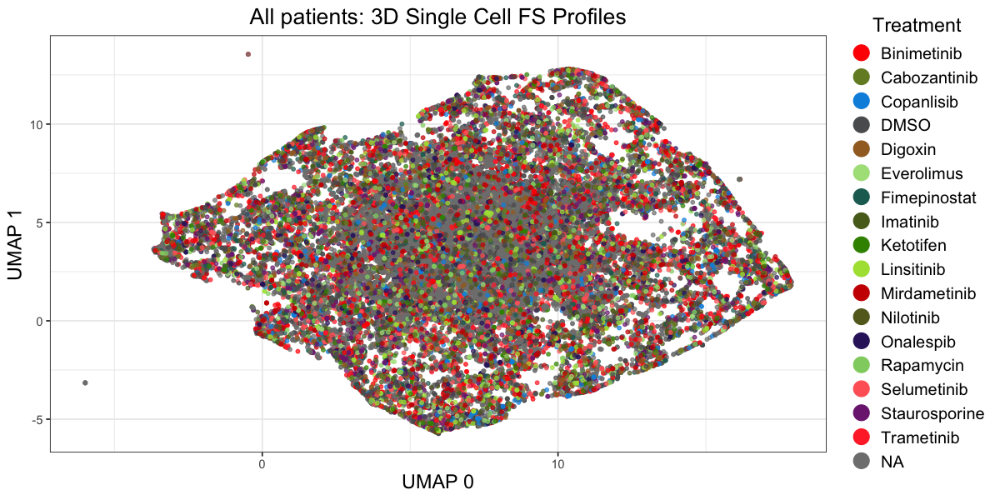

In [27]:
width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot_by_treatment <- (
    ggplot(sc_3D_umap_results, aes(x = UMAP1, y = UMAP2, color = Metadata_treatment))
    + geom_point(alpha = 0.7, size = 1)
    + scale_color_manual(values = custom_treatment_palette) 
    + labs(title = "All patients: 3D Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            title = "Treatment",
            override.aes = list(alpha = 1, size = 5),
            ncol = 1
        )
    )
)
sc_3D_features_by_treatment_path <- file.path(figures_path, "3D", "all_patients_umap_3D_features_by_treatment.png")
ggsave(umap_sc_plot_by_treatment, file = sc_3D_features_by_treatment_path, width = width, height = height, dpi = 300)
umap_sc_plot_by_treatment

Warning message:
“Removed 10886 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 10886 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 10886 rows containing missing values or values outside the scale range
(`geom_point()`).”


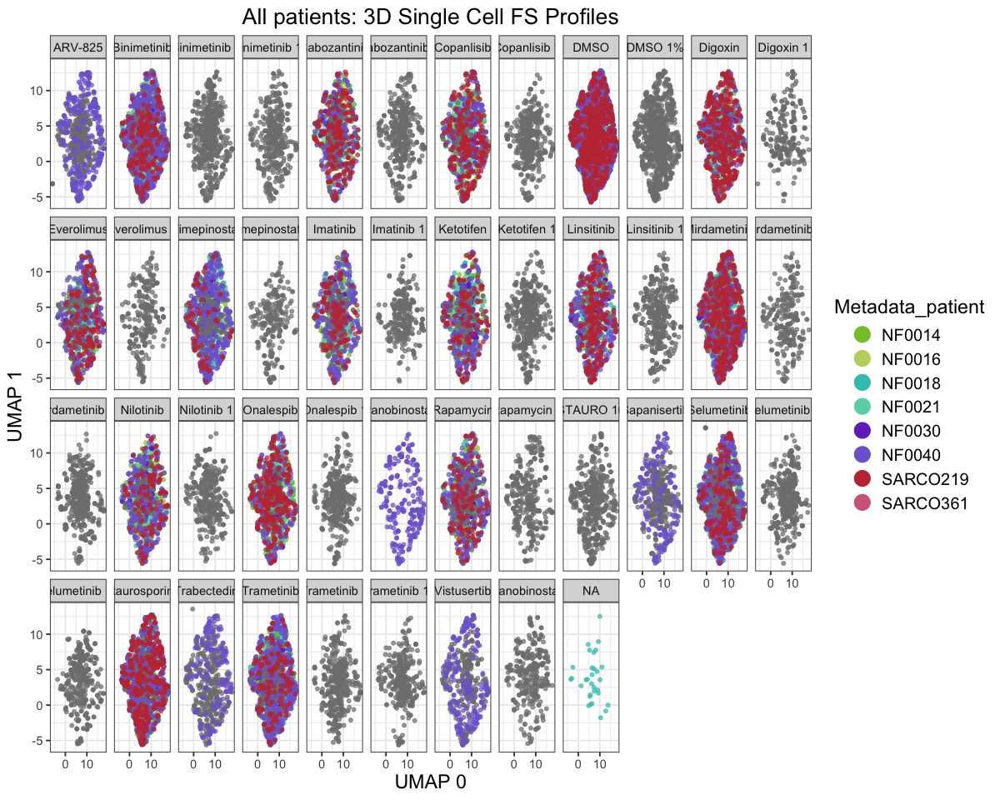

In [28]:
width <- 10
height <- 8
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot_facet_treatment <- (
    ggplot(sc_3D_umap_results, aes(x = UMAP1, y = UMAP2, color = Metadata_patient))
    + geom_point(alpha = 0.7, size = 1)
    + scale_color_manual(values = patient_color_palette)
    + labs(title = "All patients: 3D Single Cell FS Profiles", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme

    + guides(
        color = guide_legend(
            override.aes = list(alpha = 1, size = 5),
            ncol = 1
        )
    )
    + facet_wrap(~Metadata_treatment, nrow = 4)  
)
sc_3D_features_facet_treatment_path <- file.path(figures_path, "3D", "all_patients_umap_3D_sc_features_facet_by_treatment.png")
ggsave(umap_sc_plot_facet_treatment, file = sc_3D_features_facet_treatment_path, width = width, height = height, dpi = 300)
umap_sc_plot_facet_treatment

Warning message:
“Removed 2021 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 2021 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 2021 rows containing missing values or values outside the scale range
(`geom_point()`).”


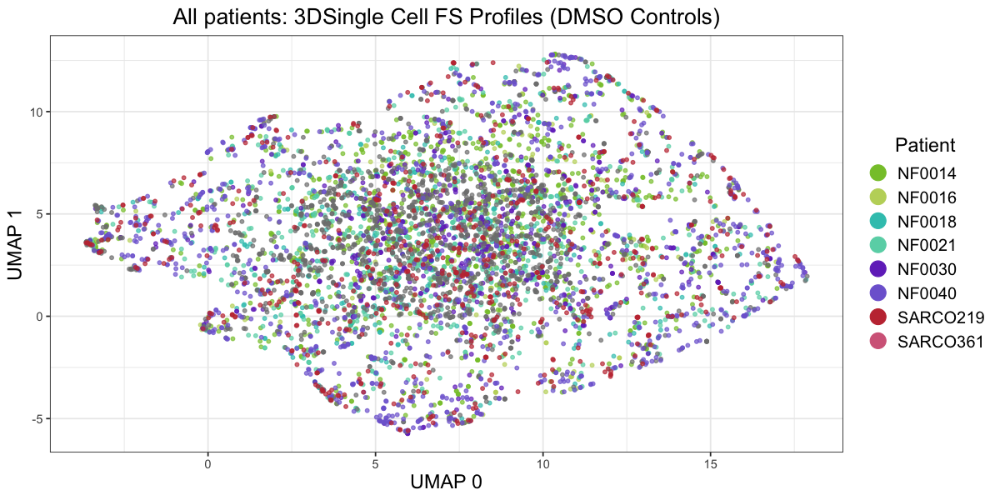

In [29]:
# Filter for DMSO only
sc_umap_results_dmsos <- sc_3D_umap_results %>%
    filter(Metadata_treatment == "DMSO")

width <- 10
height <- 5
options(repr.plot.width = width, repr.plot.height = height)
umap_sc_plot_dmso <- (
    ggplot(sc_umap_results_dmsos, aes(x = UMAP1, y = UMAP2, color = Metadata_patient))
    + geom_point(alpha = 0.7, size = 1)
    + scale_color_manual(values = patient_color_palette)
    + labs(title = "All patients: 3DSingle Cell FS Profiles (DMSO Controls)", x = "UMAP 0", y = "UMAP 1")
    + theme_bw()
    + umap_theme
    + theme(
        legend.text = element_text(size = 12),
        legend.title = element_text(size = 14, hjust = 0.5)
    )
    + guides(
        color = guide_legend(
            title = "Patient",
            override.aes = list(alpha = 1, size = 5),
            ncol = 1
        )
    )
)
sc_features_3D_dmso_path <- file.path(figures_path, "3D", "all_patients_sc_3D_fs_by_patient_dmso_only.png")
ggsave(umap_sc_plot_dmso, file = sc_features_3D_dmso_path, width = width, height = height, dpi = 300)
umap_sc_plot_dmso

## Single patient UMAPs

In [30]:
individual_patients <- c("NF0014_T1", "NF0016_T1", "NF0018_T6", "NF0021_T1", "NF0030_T1",  "NF0040_T1", "SARCO219_T2", "SARCO361_T1")
hex_codes <- c(
    "#86C436",
    "#BFD468",
    "#36C4BB",
    "#68D4B4",
    "#7336C4",
    "#7E68D4",
    "#C4363F",
    "#D46888"
)

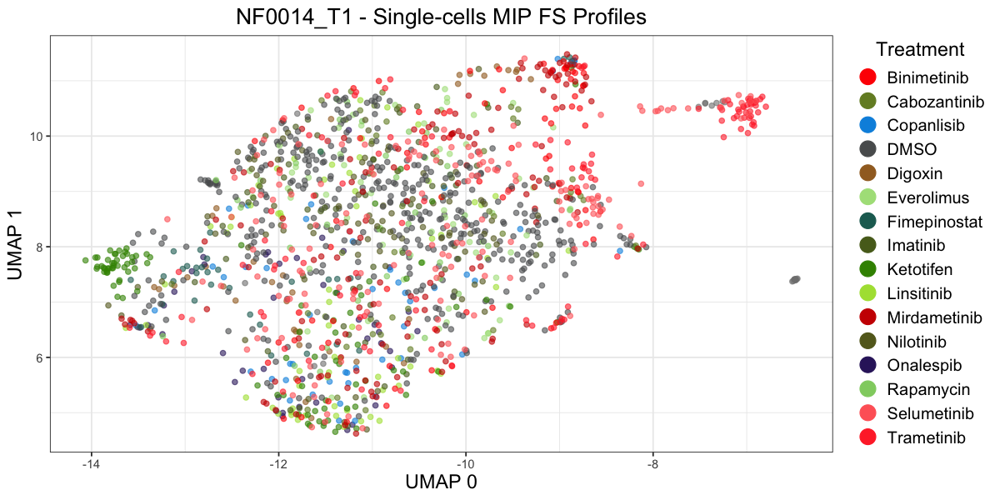

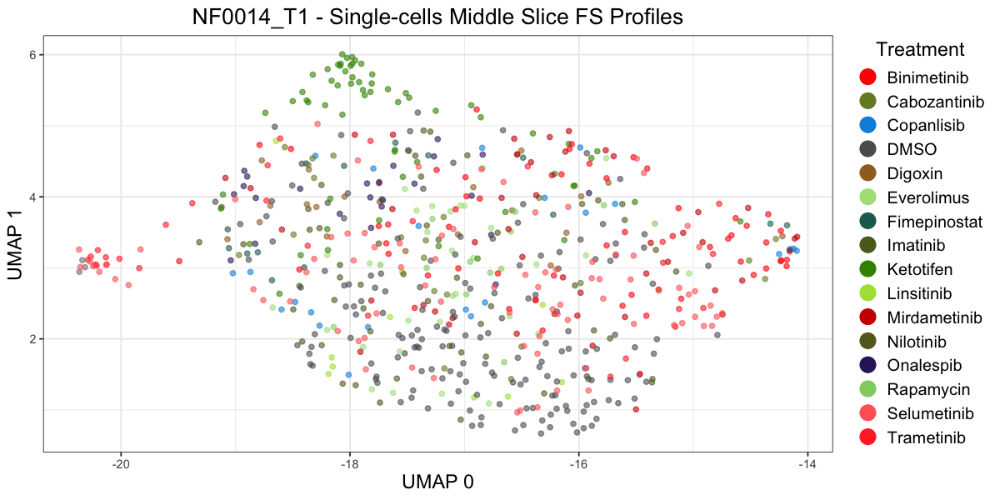

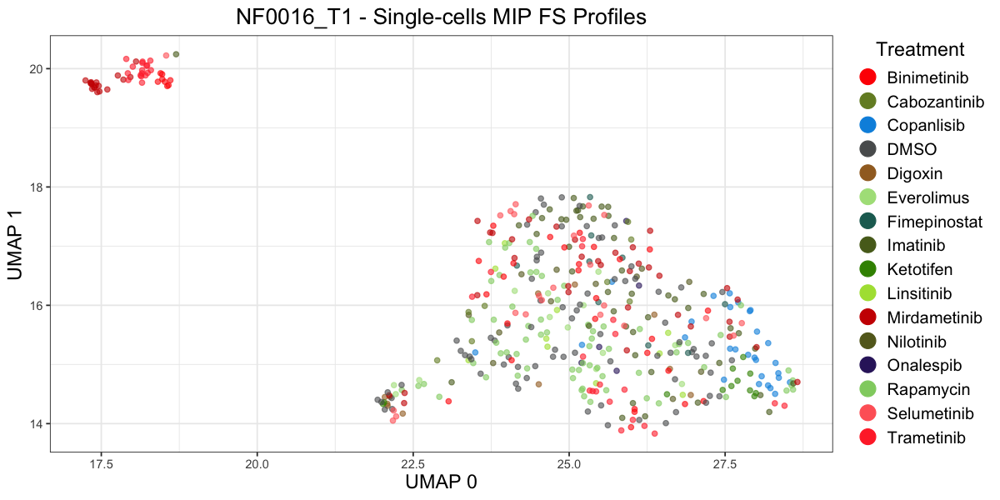

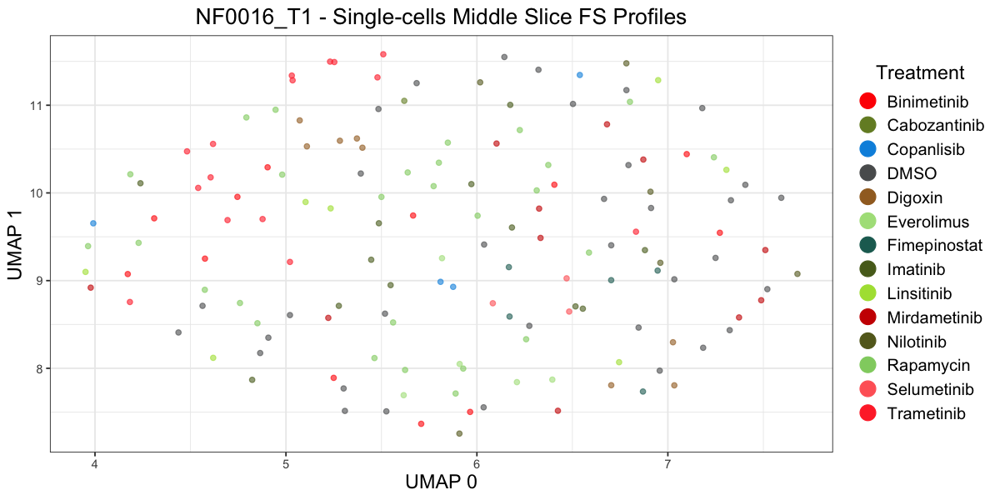

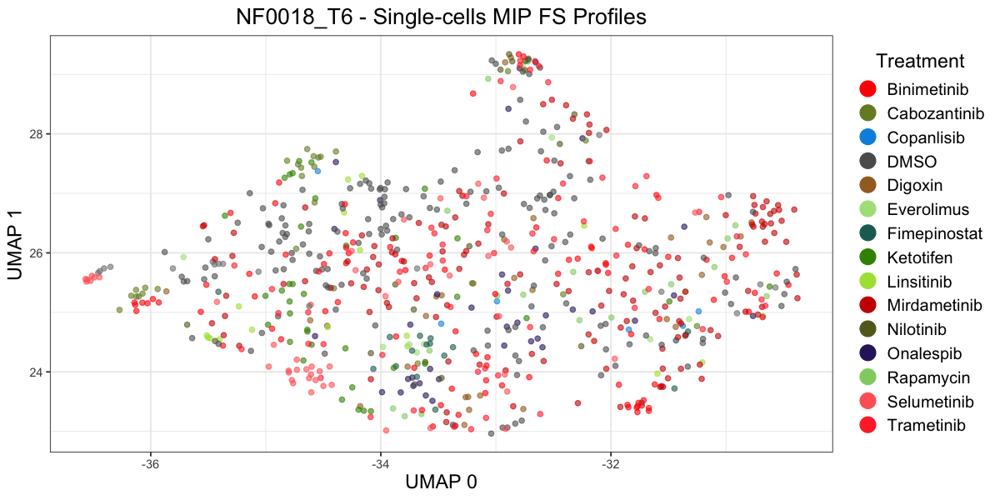

...

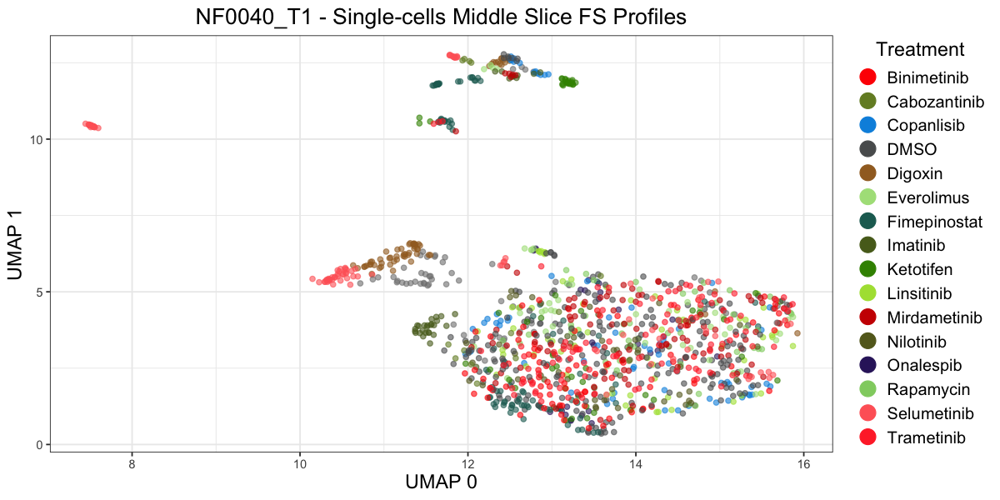

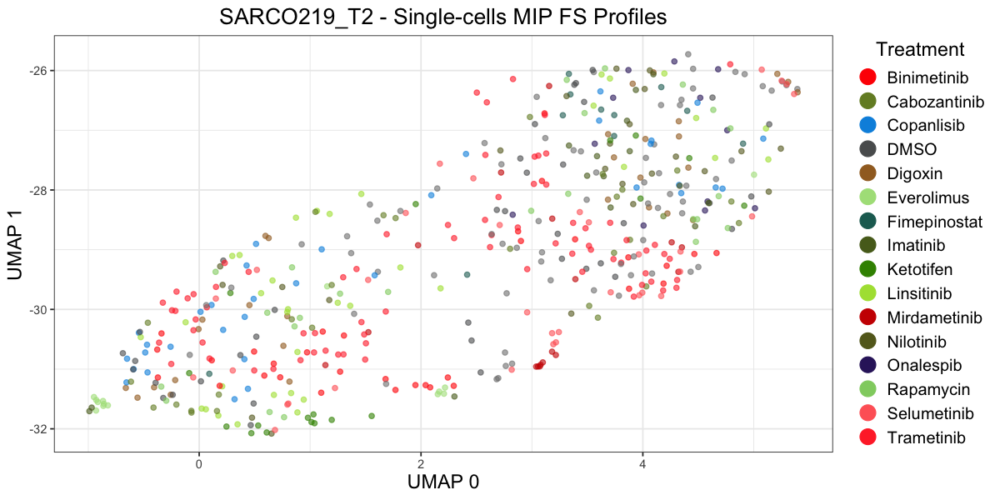

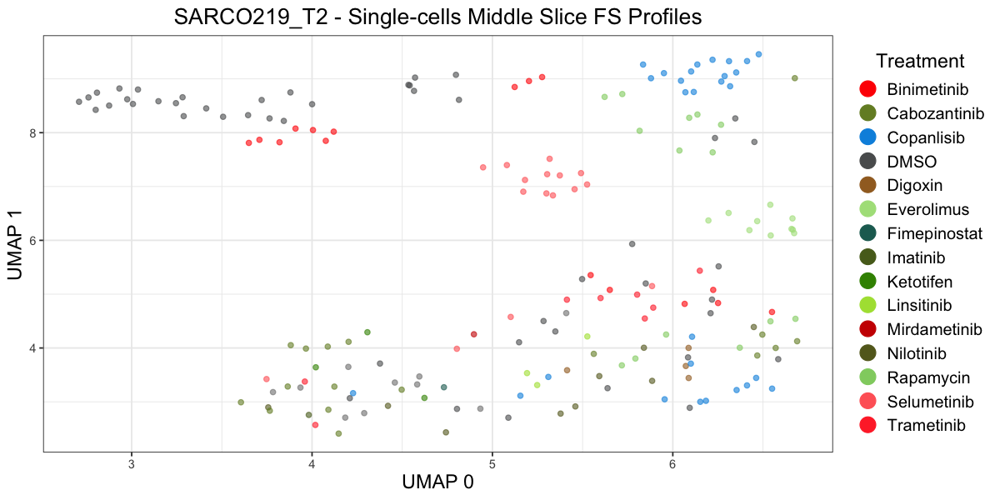

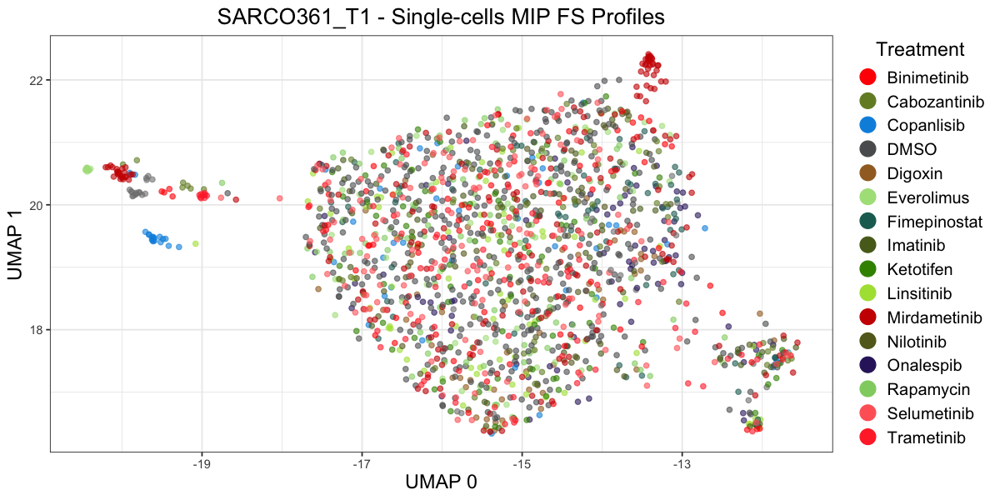

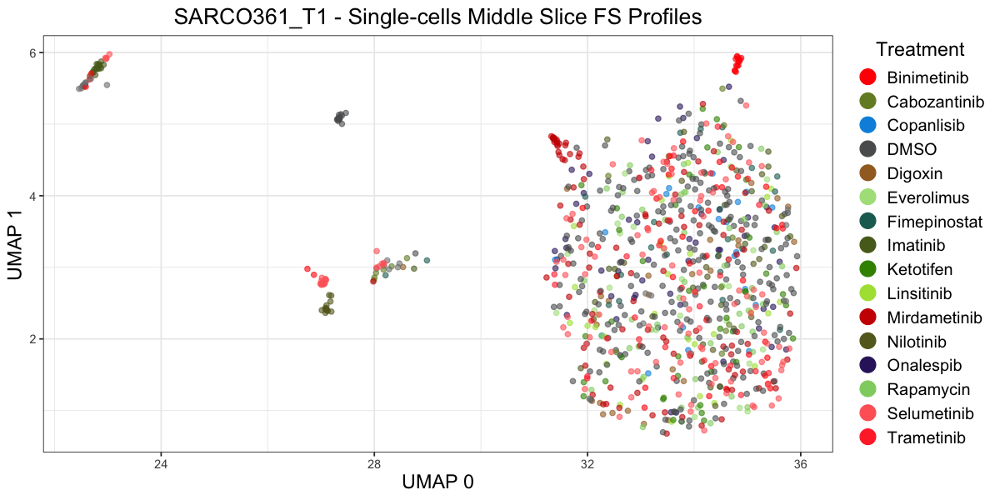

In [31]:
for (patient in individual_patients) {
    # patient_umap_file_path <- file.path(root_dir, paste0("5.EDA/results/patient_results/",patient,"_organoid_fs_umap.parquet"))
    # umap_results_patient <- arrow::read_parquet(patient_umap_file_path)
    # umap_results_patient

    # width <- 10
    # height <- 5
    # options(repr.plot.width = width, repr.plot.height = height)
    # umap_organoid_plot <- (
    #     ggplot(umap_results_patient, aes(x = UMAP1, y = UMAP2, color = Target, size = single_cell_count))
    #     + geom_point(alpha = 0.7)
    #     + scale_color_manual(values = custom_MOA_palette)
    #     + labs(title = paste(patient," - Organoid FS Profiles"), x = "UMAP 0", y = "UMAP 1")
    #     + theme_bw()
    #     + umap_theme

    #     + guides(
    #         size = guide_legend(
    #             title = "Single Cell Count",
    #             text = element_text(size = 16, hjust = 0.5),
    #             # make two columns for the legend
    #             nrow = 1,
    #             # title position to top

    #             # move to bottom
    #             # position = "bottom"
                
    #             ),
    #         color = guide_legend(
    #             title = "Target",
    #             text = element_text(size = 16, hjust = 0.5, position = "top"),
    #             override.aes = list(alpha = 1,size = 5),
    #             # nrow = 2,
    #             ncol = 1
    #             # position = "bottom"
    #         )
    #     )
        
    # )
    # print(umap_organoid_plot)
    
    patient_umap_file_path <- file.path(root_dir, paste0("1.EDA/results/umap/patient_results/2D/max_projection/",patient,"_sc_fs_umap.parquet"))
    umap_results_patient <- arrow::read_parquet(patient_umap_file_path)
    
    width <- 10
    height <- 5
    options(repr.plot.width = width, repr.plot.height = height)
    
    umap_sc_2D_MIP_color_by_treatment_plot <- (
        ggplot(umap_results_patient, aes(x = UMAP1, y = UMAP2, color = Metadata_treatment))
        + geom_point(alpha = 0.6)
        + scale_color_manual(values = custom_treatment_palette)  # adjust if you need a different palette
        + labs(title = paste0(patient," - Single-cells MIP FS Profiles"), x = "UMAP 0", y = "UMAP 1")
        + theme_bw()
        + umap_theme
        + guides(
            color = guide_legend(
                title = "Treatment",
                override.aes = list(alpha = 1, size = 5),
                ncol = 1
            )
        )
    )
    
    print(umap_sc_2D_MIP_color_by_treatment_plot)

    patient_umap_file_path <- file.path(root_dir, paste0("1.EDA/results/umap/patient_results/2D/middle_slice/",patient,"_sc_fs_umap.parquet"))
    umap_results_patient <- arrow::read_parquet(patient_umap_file_path)
    
    width <- 10
    height <- 5
    options(repr.plot.width = width, repr.plot.height = height)
    
    umap_sc_2D_middle_slice_color_by_treatment_plot <- (
        ggplot(umap_results_patient, aes(x = UMAP1, y = UMAP2, color = Metadata_treatment))
        + geom_point(alpha = 0.6)
        + scale_color_manual(values = custom_treatment_palette)  # adjust if you need a different palette
        + labs(title = paste0(patient," - Single-cells Middle Slice FS Profiles"), x = "UMAP 0", y = "UMAP 1")
        + theme_bw()
        + umap_theme
        + guides(
            color = guide_legend(
                title = "Treatment",
                override.aes = list(alpha = 1, size = 5),
                ncol = 1
            )
        )
    )
    
    print(umap_sc_2D_middle_slice_color_by_treatment_plot)
    
    single_cell_MIP_features_path <- file.path(figures_path, "2D", "max_projection", paste0(patient, "_sc_fs_umap_color_by_treatment.png"))
    ggsave(umap_sc_2D_MIP_color_by_treatment_plot, file = single_cell_MIP_features_path, width = width, height = height, dpi = 400)
    single_cell_MS_features_path <- file.path(figures_path, "2D", "middle_slice", paste0(patient, "_sc_fs_umap_color_by_treatment.png"))  
    ggsave(umap_sc_2D_middle_slice_color_by_treatment_plot, file = single_cell_MS_features_path, width = width, height = height, dpi = 400)
}